In [23]:
import tensorflow as tf
import pandas as pd

# Set memory growth BEFORE any TensorFlow operations
physical_devices = tf.config.list_physical_devices('GPU')
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available:", len(physical_devices))
if len(physical_devices) > 0:
    print("GPU detected:", physical_devices)
    for gpu in physical_devices:
        tf.config.experimental.set_memory_growth(gpu, True)
else:
    print("No GPU detected. Running on CPU.")

TensorFlow version: 2.10.1
Num GPUs Available: 1
GPU detected: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [25]:
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import os
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils.class_weight import compute_class_weight
import seaborn as sns
import matplotlib.pyplot as plt

In [26]:
# Paths
train_dir = r'D:\CADT\CapstoneProjectI\ml__model\data\splited_data\train'
val_dir = r'D:\CADT\CapstoneProjectI\ml__model\data\splited_data\val'
test_dir = r'D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test'

In [27]:
# Parameters
IMG_SIZE = (224, 224)  # MobileNetV2 default input size
BATCH_SIZE = 32  # Reduced due to compute constraints
NUM_CLASSES = 7
INITIAL_EPOCHS = 10
FINE_TUNE_EPOCHS = 20
TOTAL_EPOCHS = INITIAL_EPOCHS + FINE_TUNE_EPOCHS

In [28]:
# Data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.2,
    zoom_range=[0.7, 1.3],
    brightness_range=[0.7, 1.3],
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest',
    preprocessing_function=lambda x: x + np.random.normal(0, 0.1, x.shape)
)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [29]:
# Data generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 12137 images belonging to 7 classes.
Found 3474 images belonging to 7 classes.
Found 1737 images belonging to 7 classes.


In [30]:
# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_generator.classes), y=train_generator.classes)
class_weight_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weight_dict)

Class Weights: {0: 0.9913419913419913, 1: 1.0283850194882223, 2: 0.9964696223316913, 3: 1.0051345755693581, 4: 0.9913419913419913, 5: 0.9970426353405076, 6: 0.9913419913419913}


In [31]:
# Model setup with MobileNetV2
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False
inputs = tf.keras.Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = Model(inputs, outputs)

In [32]:
# Compile with Adam optimizer
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [33]:
# Custom callback for formatted output
class CustomCallback(tf.keras.callbacks.Callback):
    def __init__(self, phase_epochs, phase_name):
        super(CustomCallback, self).__init__()
        self.phase_epochs = phase_epochs
        self.phase_name = phase_name

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        lr = self.model.optimizer.lr.numpy()
        loss = logs.get('loss')
        accuracy = logs.get('accuracy')
        if self.phase_name == "Fine-tuning":
            epoch_display = epoch + INITIAL_EPOCHS + 1
            total_display = TOTAL_EPOCHS
        else:
            epoch_display = epoch + 1
            total_display = self.phase_epochs
        print(f"\nEpoch {epoch_display}: Learning Rate: {lr:.6f}, Loss: {loss:.4f}, Accuracy: {accuracy:.4f}")

In [34]:
# Early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

In [35]:
# Learning rate scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

In [36]:
# Initial training
print(f"Initial training for {INITIAL_EPOCHS} epochs...")
initial_callback = CustomCallback(INITIAL_EPOCHS, "Initial")
history_initial = model.fit(
    train_generator,
    epochs=INITIAL_EPOCHS,
    validation_data=val_generator,
    verbose=1,
    callbacks=[initial_callback, early_stopping, lr_scheduler],
    class_weight=class_weight_dict
)

Initial training for 10 epochs...
Epoch 1/10
380/380 [==============================] - ETA: 0s - loss: 1.3498 - accuracy: 0.4950
Epoch 1: Learning Rate: 0.001000, Loss: 1.3498, Accuracy: 0.4950
380/380 [==============================] - 328s 857ms/step - loss: 1.3498 - accuracy: 0.4950 - val_loss: 0.9677 - val_accuracy: 0.6505 - lr: 0.0010
Epoch 2/10
380/380 [==============================] - ETA: 0s - loss: 1.0835 - accuracy: 0.5921
Epoch 2: Learning Rate: 0.001000, Loss: 1.0835, Accuracy: 0.5921
380/380 [==============================] - 237s 625ms/step - loss: 1.0835 - accuracy: 0.5921 - val_loss: 0.8669 - val_accuracy: 0.6767 - lr: 0.0010
Epoch 3/10
380/380 [==============================] - ETA: 0s - loss: 1.0034 - accuracy: 0.6184
Epoch 3: Learning Rate: 0.001000, Loss: 1.0034, Accuracy: 0.6184
380/380 [==============================] - 232s 609ms/step - loss: 1.0034 - accuracy: 0.6184 - val_loss: 0.7989 - val_accuracy: 0.7127 - lr: 0.0010
Epoch 4/10
380/380 [===================

In [37]:
# Fine-tuning
base_model.trainable = True
fine_tune_at = 80  # MobileNetV2 has 154 layers; unfreeze last ~74 layers
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [38]:
# Recompile with lower learning rate
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [39]:
print(f"\nFine-tuning for {FINE_TUNE_EPOCHS} epochs...")
fine_tune_callback = CustomCallback(FINE_TUNE_EPOCHS, "Fine-tuning")
history_fine = model.fit(
    train_generator,
    epochs=TOTAL_EPOCHS,
    initial_epoch=INITIAL_EPOCHS,
    validation_data=val_generator,
    verbose=1,
    callbacks=[fine_tune_callback, early_stopping, lr_scheduler],
    class_weight=class_weight_dict
)


Fine-tuning for 20 epochs...
Epoch 11/30
380/380 [==============================] - ETA: 0s - loss: 0.9981 - accuracy: 0.6346
Epoch 21: Learning Rate: 0.000100, Loss: 0.9981, Accuracy: 0.6346
380/380 [==============================] - 325s 849ms/step - loss: 0.9981 - accuracy: 0.6346 - val_loss: 0.6700 - val_accuracy: 0.7392 - lr: 1.0000e-04
Epoch 12/30
380/380 [==============================] - ETA: 0s - loss: 0.7515 - accuracy: 0.7224
Epoch 22: Learning Rate: 0.000100, Loss: 0.7515, Accuracy: 0.7224
380/380 [==============================] - 242s 636ms/step - loss: 0.7515 - accuracy: 0.7224 - val_loss: 0.5595 - val_accuracy: 0.7884 - lr: 1.0000e-04
Epoch 13/30
380/380 [==============================] - ETA: 0s - loss: 0.6504 - accuracy: 0.7642
Epoch 23: Learning Rate: 0.000100, Loss: 0.6504, Accuracy: 0.7642
380/380 [==============================] - 232s 611ms/step - loss: 0.6504 - accuracy: 0.7642 - val_loss: 0.4768 - val_accuracy: 0.8215 - lr: 1.0000e-04
Epoch 14/30
380/380 [====

In [ ]:
# Evaluate
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"\nTest accuracy: {test_accuracy:.4f}")
print(f"Test loss: {test_loss:.4f}")

if test_accuracy >= 0.95:
    print("Goal of 95% test accuracy achieved!")
else:
    print(f"Goal of 95% not reached. Current test accuracy: {test_accuracy:.4f}")

In [40]:
# Save model
model.save('mobilenetv2_7classes_model.h5')

Found 1737 images belonging to 7 classes.
55/55 [==============================] - 25s 432ms/step


<Figure size 1000x800 with 0 Axes>

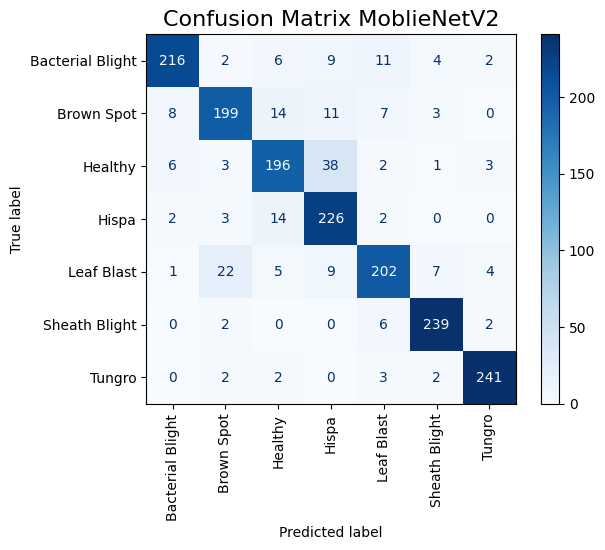

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the test data
test_dir = r'D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test'
test_datagen = ImageDataGenerator(rescale=1./255)
test_ds = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Important for correct label ordering
)

# Get true labels from the 'test_ds' directory iterator
true_labels = test_ds.classes  # True labels

# Assuming 'model' is already trained
pred_probs = model.predict(test_ds)
pred_labels = np.argmax(pred_probs, axis=1)  # Convert probabilities to class labels

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, pred_labels)

# Display the confusion matrix
class_labels = list(test_ds.class_indices.keys())  # Get class labels from the generator
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
disp.plot(cmap=plt.cm.Blues)

# Rotate x-axis labels by 90 degrees
plt.xticks(rotation=90)

plt.title('Confusion Matrix MoblieNetV2', fontsize=16)
plt.show()

Found 1737 images belonging to 7 classes.
55/55 [==============================] - 12s 228ms/step


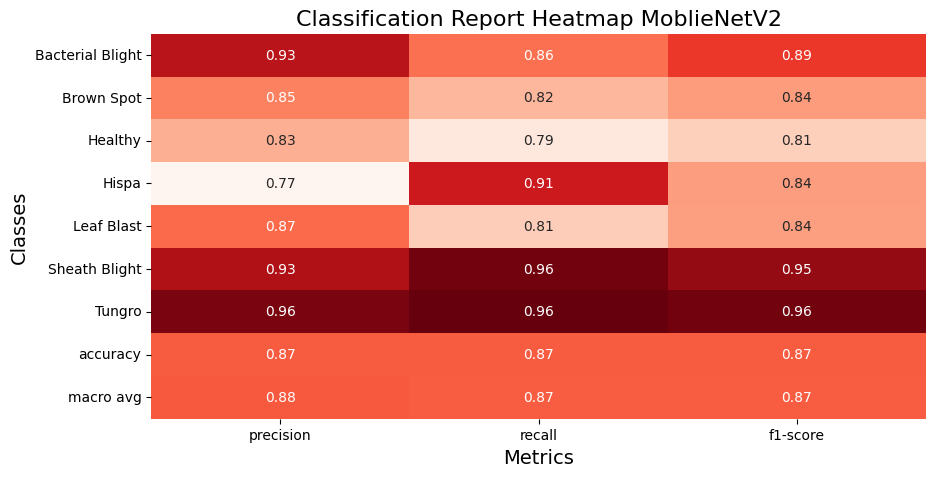

In [42]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the test data
test_dir = r'D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test'
test_datagen = ImageDataGenerator(rescale=1./255)
test_ds = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Important for correct label ordering
)

# Get true labels from the 'test_ds' directory iterator
true_labels = test_ds.classes  # True labels

# Assuming 'model' is already trained
pred_probs = model.predict(test_ds)
pred_labels = np.argmax(pred_probs, axis=1)  # Convert probabilities to class labels

# Generate a classification report
report = classification_report(true_labels, pred_labels, target_names=list(test_ds.class_indices.keys()), output_dict=True)

# Convert the report to a DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Plot the heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap=plt.cm.Reds, fmt=".2f", cbar=False)
plt.title('Classification Report Heatmap MoblieNetV2', fontsize=16)
plt.xlabel('Metrics', fontsize=14)
plt.ylabel('Classes', fontsize=14)
plt.show()

Found 1737 images belonging to 7 classes.
109/109 [==============================] - 26s 121ms/step - loss: 0.3501 - accuracy: 0.8745

Test Loss: 0.3501
Test Accuracy: 0.8745
109/109 [==============================] - 13s 114ms/step

Classification Report:
                  precision    recall  f1-score   support

Bacterial Blight       0.93      0.86      0.89       250
      Brown Spot       0.85      0.82      0.84       242
         Healthy       0.83      0.79      0.81       249
           Hispa       0.77      0.91      0.84       247
      Leaf Blast       0.86      0.81      0.83       250
   Sheath Blight       0.94      0.96      0.95       249
          Tungro       0.96      0.96      0.96       250

        accuracy                           0.87      1737
       macro avg       0.88      0.87      0.87      1737
    weighted avg       0.88      0.87      0.87      1737



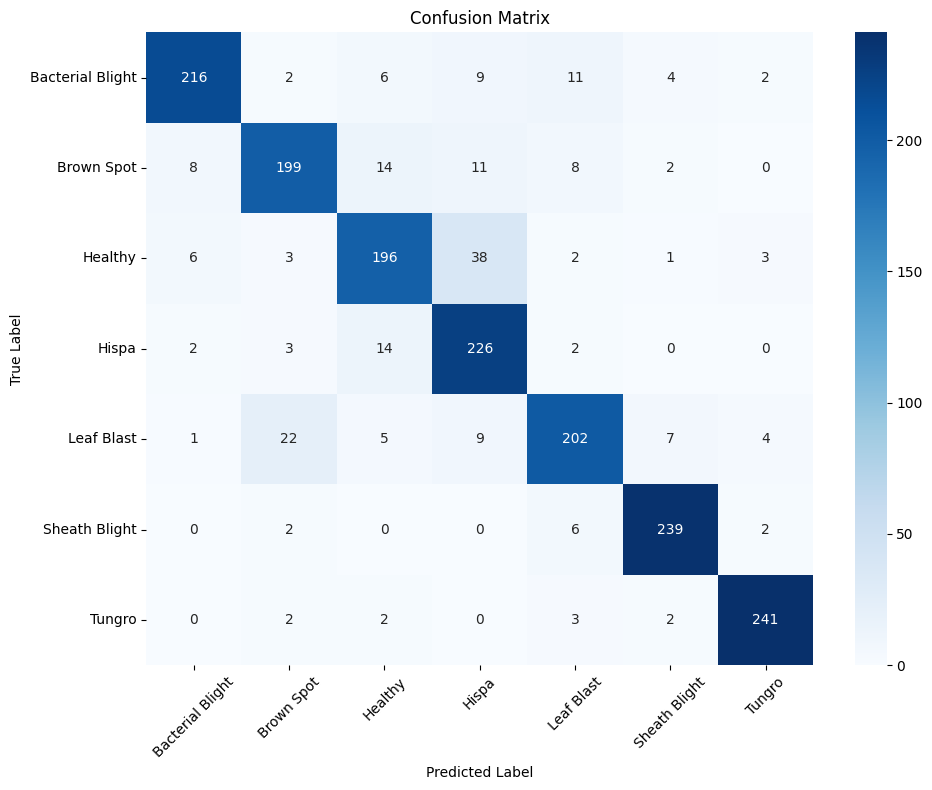

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt



# Load the model weights
model = tf.keras.models.load_model(r'D:\CADT\CapstoneProjectI\ml__model\notebooks\mobilenetv2_7classes_model.h5')

# Compile the model
model.compile(optimizer='adam', 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# Test directory
test_dir = r'D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test'

# Image dimensions and batch size
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 16

# Test data generator
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Evaluate the model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# Get predictions
test_generator.reset()  # Reset generator to start
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_generator.classes

# Get class labels
class_labels = list(test_generator.class_indices.keys())

# Classification report
print("\nClassification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Confusion matrix
cm = confusion_matrix(true_classes, predicted_classes)

# Visualize confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



Found 1737 images belonging to 7 classes.
55/55 [==============================] - 13s 241ms/step


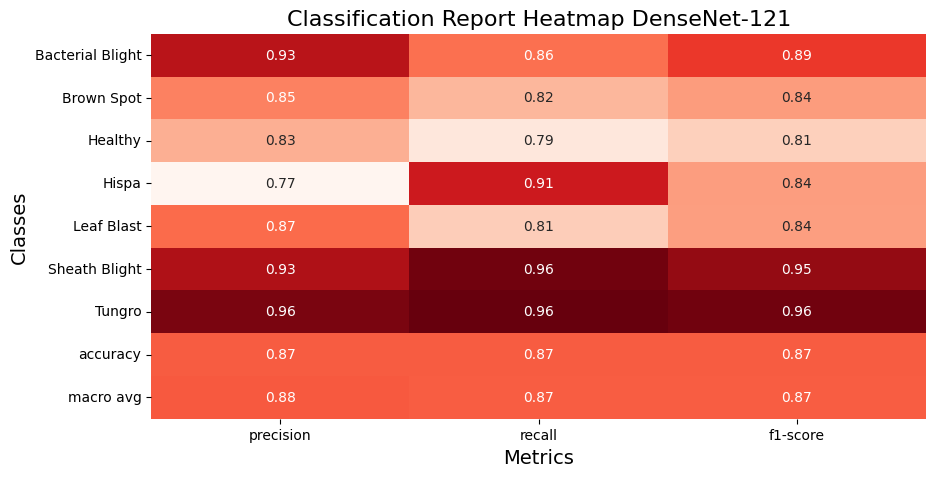

In [45]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the test data
test_dir = r'D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test'
test_datagen = ImageDataGenerator(rescale=1./255)
test_ds = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Important for correct label ordering
)

# Get true labels from the 'test_ds' directory iterator
true_labels = test_ds.classes  # True labels

# Assuming 'model' is already trained
pred_probs = model.predict(test_ds)
pred_labels = np.argmax(pred_probs, axis=1)  # Convert probabilities to class labels

# Generate a classification report
report = classification_report(true_labels, pred_labels, target_names=list(test_ds.class_indices.keys()), output_dict=True)

# Convert the report to a DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Plot the heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap=plt.cm.Reds, fmt=".2f", cbar=False)
plt.title('Classification Report Heatmap DenseNet-121', fontsize=16)
plt.xlabel('Metrics', fontsize=14)
plt.ylabel('Classes', fontsize=14)
plt.show()

109/109 [==============================] - 12s 109ms/step

Misclassified Images:
Image: D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test\Bacterial Blight\bacterial blight_0045.jpg, True Class: Bacterial Blight, Predicted Class: Hispa
Image: D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test\Bacterial Blight\bacterial blight_0057.jpg, True Class: Bacterial Blight, Predicted Class: Healthy
Image: D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test\Bacterial Blight\bacterial blight_0094.jpg, True Class: Bacterial Blight, Predicted Class: Hispa
Image: D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test\Bacterial Blight\bacterial blight_0112.jpg, True Class: Bacterial Blight, Predicted Class: Hispa
Image: D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test\Bacterial Blight\bacterial blight_0135.jpg, True Class: Bacterial Blight, Predicted Class: Hispa
Image: D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test\Bacterial Blight\bacterial blight_0189.jpg

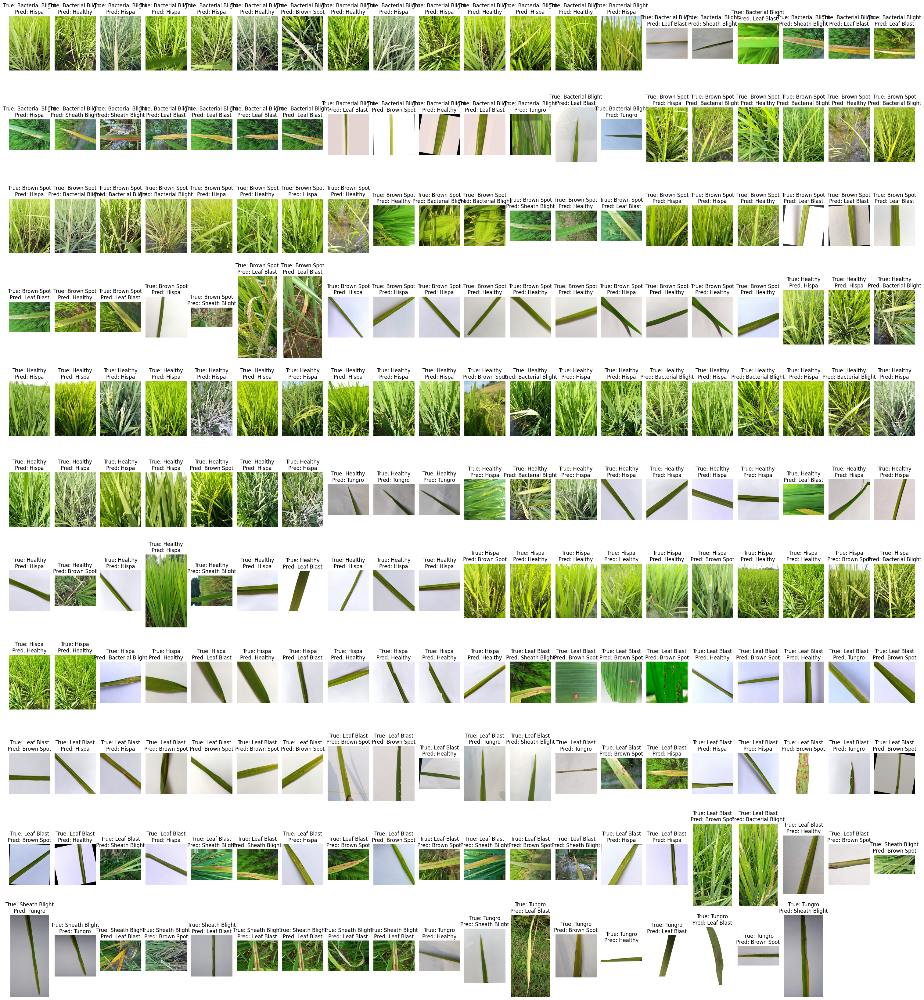

In [6]:
# Get file paths for each image in the test generator
test_generator.reset()  # Reset generator to start
file_paths = test_generator.filepaths  # Get the file paths from the generator

# Get predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_generator.classes

# Identify misclassified images
misclassified_indices = np.where(predicted_classes != true_classes)[0]
misclassified_images = [file_paths[i] for i in misclassified_indices]
misclassified_predictions = [predicted_classes[i] for i in misclassified_indices]
misclassified_true_classes = [true_classes[i] for i in misclassified_indices]

# Print misclassified images with their true and predicted labels
print("\nMisclassified Images:")
for i in range(len(misclassified_images)):
    print(f"Image: {misclassified_images[i]}, "
          f"True Class: {class_labels[misclassified_true_classes[i]]}, "
          f"Predicted Class: {class_labels[misclassified_predictions[i]]}")

# Optionally, you can display all misclassified images
import matplotlib.pyplot as plt

# Number of misclassified images
num_misclassified = len(misclassified_images)

# Set up the figure size based on the number of misclassified images
cols = 20  # Number of columns
rows = (num_misclassified + cols - 1) // cols  # Calculate rows needed

plt.figure(figsize=(30, rows * 3))  # Adjust height based on number of rows

for i, img_path in enumerate(misclassified_images):  # Loop through all misclassified images
    img = plt.imread(img_path)
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(f"True: {class_labels[misclassified_true_classes[i]]}\nPred: {class_labels[misclassified_predictions[i]]}")
    plt.axis('off')

plt.tight_layout()
plt.show()